In [253]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

plt.rcParams['text.color'] = 'black'

from sklearn.metrics.cluster import homogeneity_score

In [254]:
df = pd.read_csv('Proveindustriales_Data_Cleaned_numeric_onehot_csv.csv')

In [255]:
df.head()

,CATEGORÍA_Alimentos y Bebidas,"CATEGORÍA_Aseo, Cafetería y Oficina",CATEGORÍA_Dotación y elementos de protección personal,CATEGORÍA_Otros,CATEGORÍA_Vigilancia y seguridad industrial,SUBCATEGORÍA_Aceites y grasas comestibles,SUBCATEGORÍA_Alimentos preparados y conservados,SUBCATEGORÍA_Bebidas,SUBCATEGORÍA_Calzado,SUBCATEGORÍA_Camisas y camisetas,"SUBCATEGORÍA_Chocolates, azúcares y confitería",SUBCATEGORÍA_Condimentos y conservantes,SUBCATEGORÍA_Elementos de aseo y limpieza,SUBCATEGORÍA_Elementos de bioseguridad,SUBCATEGORÍA_Elementos de cafetería,SUBCATEGORÍA_Elementos de papelería,SUBCATEGORÍA_Elementos de protección personal,SUBCATEGORÍA_Equipo de aseo,SUBCATEGORÍA_Equipo y accesorios de oficina y escritorio,SUBCATEGORÍA_Fruta fresca,SUBCATEGORÍA_Insumos desinfección,SUBCATEGORÍA_Otra,SUBCATEGORÍA_Otros,SUBCATEGORÍA_Pantalones,SUBCATEGORÍA_Prendas uniformes,SUBCATEGORÍA_Productos de carne y aves de corral,SUBCATEGORÍA_Productos de cereales y legumbres,SUBCATEGORÍA_Productos de panadería,SUBCATEGORÍA_Productos lácteos y huevos,SUBCATEGORÍA_Seguridad y control público,SUBCATEGORÍA_Seguridad y protección personal,SUBCATEGORÍA_Señalización,SUBCATEGORÍA_Trabajo en alturas,SUBCATEGORÍA_Vegetales frescos,PROVEEDOR_Otros,PROVEEDOR_Proveedor 26,PROVEEDOR_Proveedor 28,PROVEEDOR_Proveedor 301,PROVEEDOR_Proveedor 59,COMPAÑÍA_COMPRADORA_Otros,COMPAÑÍA_COMPRADORA_Portal comprador 1,COMPAÑÍA_COMPRADORA_Portal comprador 2,COMPAÑÍA_COMPRADORA_Portal comprador 24,COMPAÑÍA_COMPRADORA_Portal comprador 29,COMPAÑÍA_COMPRADORA_Portal comprador 30,COMPAÑÍA_COMPRADORA_Portal comprador 4,COMPAÑÍA_COMPRADORA_Portal comprador 5,COMPAÑÍA_COMPRADORA_Portal comprador 6,COMPAÑÍA_COMPRADORA_Portal comprador 8,ESTADO_Cancelado,ESTADO_Enviado,ESTADO_Finalizado Incompleto,ESTADO_Orden Confirmada,ESTADO_Orden Rechazada,ESTADO_Orden en Proceso,ESTADO_Pendiente por Aprobar,ESTADO_Recibido,ESTADO_Recibido Parcial,CANTIDAD_PEDIDA,CANTIDAD_RECIBIDA,PRECIO_UNITARIO,IVA,TOTAL_SIN_IVA
0,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.45,0.08,0.89
1,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.70,0.13,0.70
2,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.10,0.00,1.00
3,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.02,0.00,1.00
4,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.14,0.03,0.99


In [256]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22392 entries, 0 to 22391
Data columns (total 63 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   CATEGORÍA_Alimentos y Bebidas                             22392 non-null  float64
 1   CATEGORÍA_Aseo, Cafetería y Oficina                       22392 non-null  float64
 2   CATEGORÍA_Dotación y elementos de protección personal     22392 non-null  float64
 3   CATEGORÍA_Otros                                           22392 non-null  float64
 4   CATEGORÍA_Vigilancia y seguridad industrial               22392 non-null  float64
 5   SUBCATEGORÍA_Aceites y grasas comestibles                 22392 non-null  float64
 6   SUBCATEGORÍA_Alimentos preparados y conservados           22392 non-null  float64
 7   SUBCATEGORÍA_Bebidas                                      22392 non-null  float64
 8   SUBCATEGORÍA_Cal

In [257]:
df.columns

Index(['CATEGORÍA_Alimentos y Bebidas', 'CATEGORÍA_Aseo, Cafetería y Oficina',
       'CATEGORÍA_Dotación y elementos de protección personal',
       'CATEGORÍA_Otros', 'CATEGORÍA_Vigilancia y seguridad industrial',
       'SUBCATEGORÍA_Aceites y grasas comestibles',
       'SUBCATEGORÍA_Alimentos preparados y conservados',
       'SUBCATEGORÍA_Bebidas', 'SUBCATEGORÍA_Calzado',
       'SUBCATEGORÍA_Camisas y camisetas',
       'SUBCATEGORÍA_Chocolates, azúcares y confitería',
       'SUBCATEGORÍA_Condimentos y conservantes',
       'SUBCATEGORÍA_Elementos de aseo y limpieza',
       'SUBCATEGORÍA_Elementos de bioseguridad',
       'SUBCATEGORÍA_Elementos de cafetería',
       'SUBCATEGORÍA_Elementos de papelería',
       'SUBCATEGORÍA_Elementos de protección personal',
       'SUBCATEGORÍA_Equipo de aseo',
       'SUBCATEGORÍA_Equipo y accesorios de oficina y escritorio',
       'SUBCATEGORÍA_Fruta fresca', 'SUBCATEGORÍA_Insumos desinfección',
       'SUBCATEGORÍA_Otra', 'SUBCATEGORÍA_

## DROP SOME COLUMNS

In [258]:
cols_to_drop = ['SUBCATEGORÍA_Aceites y grasas comestibles',
       'SUBCATEGORÍA_Alimentos preparados y conservados',
       'SUBCATEGORÍA_Bebidas', 'SUBCATEGORÍA_Calzado',
       'SUBCATEGORÍA_Camisas y camisetas',
       'SUBCATEGORÍA_Chocolates, azúcares y confitería',
       'SUBCATEGORÍA_Condimentos y conservantes',
       'SUBCATEGORÍA_Elementos de aseo y limpieza',
       'SUBCATEGORÍA_Elementos de bioseguridad',
       'SUBCATEGORÍA_Elementos de cafetería',
       'SUBCATEGORÍA_Elementos de papelería',
       'SUBCATEGORÍA_Elementos de protección personal',
       'SUBCATEGORÍA_Equipo de aseo',
       'SUBCATEGORÍA_Equipo y accesorios de oficina y escritorio',
       'SUBCATEGORÍA_Fruta fresca', 'SUBCATEGORÍA_Insumos desinfección',
       'SUBCATEGORÍA_Otra', 'SUBCATEGORÍA_Otros', 'SUBCATEGORÍA_Pantalones',
       'SUBCATEGORÍA_Prendas uniformes',
       'SUBCATEGORÍA_Productos de carne y aves de corral',
       'SUBCATEGORÍA_Productos de cereales y legumbres',
       'SUBCATEGORÍA_Productos de panadería',
       'SUBCATEGORÍA_Productos lácteos y huevos',
       'SUBCATEGORÍA_Seguridad y control público',
       'SUBCATEGORÍA_Seguridad y protección personal',
       'SUBCATEGORÍA_Señalización', 'SUBCATEGORÍA_Trabajo en alturas',
       'SUBCATEGORÍA_Vegetales frescos', 'PROVEEDOR_Otros',
        ]

In [259]:
df.drop(cols_to_drop, inplace=True, axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22392 entries, 0 to 22391
Data columns (total 33 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   CATEGORÍA_Alimentos y Bebidas                          22392 non-null  float64
 1   CATEGORÍA_Aseo, Cafetería y Oficina                    22392 non-null  float64
 2   CATEGORÍA_Dotación y elementos de protección personal  22392 non-null  float64
 3   CATEGORÍA_Otros                                        22392 non-null  float64
 4   CATEGORÍA_Vigilancia y seguridad industrial            22392 non-null  float64
 5   PROVEEDOR_Proveedor 26                                 22392 non-null  float64
 6   PROVEEDOR_Proveedor 28                                 22392 non-null  float64
 7   PROVEEDOR_Proveedor 301                                22392 non-null  float64
 8   PROVEEDOR_Proveedor 59                        

In [260]:
cols_to_drop = ['ESTADO_Cancelado',
       'ESTADO_Enviado', 'ESTADO_Finalizado Incompleto',
       'ESTADO_Orden Confirmada', 'ESTADO_Orden Rechazada',
       'ESTADO_Orden en Proceso', 'ESTADO_Pendiente por Aprobar',
       'ESTADO_Recibido', 'ESTADO_Recibido Parcial'
               ]

In [261]:
df.drop(cols_to_drop, inplace=True, axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22392 entries, 0 to 22391
Data columns (total 24 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   CATEGORÍA_Alimentos y Bebidas                          22392 non-null  float64
 1   CATEGORÍA_Aseo, Cafetería y Oficina                    22392 non-null  float64
 2   CATEGORÍA_Dotación y elementos de protección personal  22392 non-null  float64
 3   CATEGORÍA_Otros                                        22392 non-null  float64
 4   CATEGORÍA_Vigilancia y seguridad industrial            22392 non-null  float64
 5   PROVEEDOR_Proveedor 26                                 22392 non-null  float64
 6   PROVEEDOR_Proveedor 28                                 22392 non-null  float64
 7   PROVEEDOR_Proveedor 301                                22392 non-null  float64
 8   PROVEEDOR_Proveedor 59                        

In [90]:
#cols_to_drop = ['PROVEEDOR_Proveedor 26', 'PROVEEDOR_Proveedor 28',
       'PROVEEDOR_Proveedor 301', 'PROVEEDOR_Proveedor 59'
               ]

In [91]:
#df.drop(cols_to_drop, inplace=True, axis=1)
#df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22392 entries, 0 to 22391
Data columns (total 20 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   CATEGORÍA_Alimentos y Bebidas                          22392 non-null  float64
 1   CATEGORÍA_Aseo, Cafetería y Oficina                    22392 non-null  float64
 2   CATEGORÍA_Dotación y elementos de protección personal  22392 non-null  float64
 3   CATEGORÍA_Otros                                        22392 non-null  float64
 4   CATEGORÍA_Vigilancia y seguridad industrial            22392 non-null  float64
 5   COMPAÑÍA_COMPRADORA_Otros                              22392 non-null  float64
 6   COMPAÑÍA_COMPRADORA_Portal comprador 1                 22392 non-null  float64
 7   COMPAÑÍA_COMPRADORA_Portal comprador 2                 22392 non-null  float64
 8   COMPAÑÍA_COMPRADORA_Portal comprador 24       

# CLUSTERING

In [262]:
from sklearn import metrics
from sklearn.cluster import KMeans

## ELBOW METHOD

In [263]:
wcss = []
for i in range (1, 10):
    kmeans = KMeans(n_clusters=i, max_iter=200)
    kmeans.fit(df)
    wcss.append(kmeans.inertia_)

Text(0, 0.5, 'Clustering score')

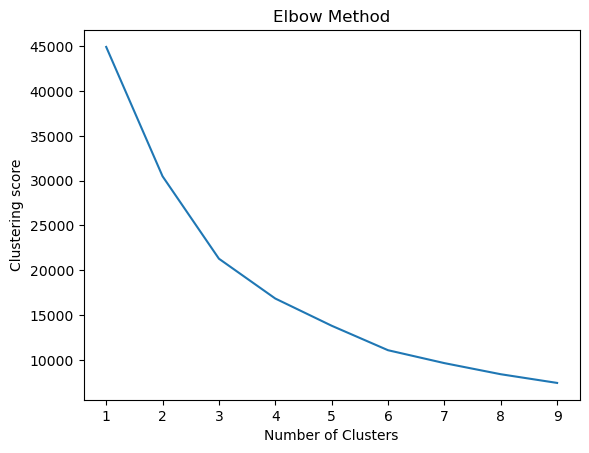

In [264]:
plt.plot(range(1,10), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Clustering score')

In [265]:
wcss

[44912.02933137958,
 30484.20772528414,
 21292.990896684907,
 16851.642409047963,
 13818.20789059742,
 11087.675350483192,
 9648.948148428812,
 8409.609162409477,
 7440.189248132247]

In [266]:
for i in range (1, 10):
    print(i, wcss[i-1])

1 44912.02933137958
2 30484.20772528414
3 21292.990896684907
4 16851.642409047963
5 13818.20789059742
6 11087.675350483192
7 9648.948148428812
8 8409.609162409477
9 7440.189248132247


In [267]:
elbow_table=pd.DataFrame()
elbow_table['k'] = [1,2,3,4,5,6,7,8,9]
elbow_table['Score'] = wcss
for i in range (1, len(elbow_table)):
    elbow_table.loc[i,'Delta1'] = elbow_table.loc[i-1,'Score'] - elbow_table.loc[i,'Score']
for i in range (2, len(elbow_table)):
    elbow_table.loc[i,'Delta2'] = elbow_table.loc[i-1,'Delta1'] - elbow_table.loc[i,'Delta1']
for i in range (1, len(elbow_table)-1):
    elbow_table.loc[i,'Strength'] = elbow_table.loc[i+1,'Delta2'] - elbow_table.loc[i+1,'Delta1']
for i in range (1, len(elbow_table)-1):
    elbow_table.loc[i,'Relative_Strength'] = elbow_table.loc[i,'Strength'] / elbow_table.loc[i,'k']
elbow_table

,k,Score,Delta1,Delta2,Strength,Relative_Strength
0,1,"44,912.03",nan,nan,nan,nan
1,2,"30,484.21","14,427.82",nan,"-3,954.61","-1,977.31"
2,3,"21,292.99","9,191.22","5,236.60",308.52,102.84
3,4,"16,851.64","4,441.35","4,749.87","-1,625.52",-406.38
4,5,"13,818.21","3,033.43","1,407.91","-2,427.63",-485.53
5,6,"11,087.68","2,730.53",302.90,-146.92,-24.49
6,7,"9,648.95","1,438.73","1,291.81","-1,039.95",-148.56
7,8,"8,409.61","1,239.34",199.39,-699.50,-87.44
8,9,"7,440.19",969.42,269.92,nan,nan


In [268]:
n_clusters = elbow_table.loc[elbow_table['Relative_Strength'] > 0]
n_clusters.sort_values(by='Relative_Strength', ascending=False)

,k,Score,Delta1,Delta2,Strength,Relative_Strength
2,3,"21,292.99","9,191.22","5,236.60",308.52,102.84


In [269]:
n_clusters = n_clusters.iloc[0,0]
n_clusters

3

In [223]:
#n_clusters.values

array([[3]], dtype=int64)

In [ ]:
#n_clusters = elbow_table.loc[elbow_table['Relative_Strength'] > 0, ['k']]

## CREATE THE CLUSTER WITH OPTIMAL N_CLUSTER

In [270]:
clustering = KMeans(n_clusters=n_clusters, max_iter=300)
clustering.fit(df)

KMeans(n_clusters=3)

In [271]:
df.head()

,CATEGORÍA_Alimentos y Bebidas,"CATEGORÍA_Aseo, Cafetería y Oficina",CATEGORÍA_Dotación y elementos de protección personal,CATEGORÍA_Otros,CATEGORÍA_Vigilancia y seguridad industrial,PROVEEDOR_Proveedor 26,PROVEEDOR_Proveedor 28,PROVEEDOR_Proveedor 301,PROVEEDOR_Proveedor 59,COMPAÑÍA_COMPRADORA_Otros,COMPAÑÍA_COMPRADORA_Portal comprador 1,COMPAÑÍA_COMPRADORA_Portal comprador 2,COMPAÑÍA_COMPRADORA_Portal comprador 24,COMPAÑÍA_COMPRADORA_Portal comprador 29,COMPAÑÍA_COMPRADORA_Portal comprador 30,COMPAÑÍA_COMPRADORA_Portal comprador 4,COMPAÑÍA_COMPRADORA_Portal comprador 5,COMPAÑÍA_COMPRADORA_Portal comprador 6,COMPAÑÍA_COMPRADORA_Portal comprador 8,CANTIDAD_PEDIDA,CANTIDAD_RECIBIDA,PRECIO_UNITARIO,IVA,TOTAL_SIN_IVA
0,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.45,0.08,0.89
1,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.70,0.13,0.70
2,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.10,0.00,1.00
3,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.00,1.00
4,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.14,0.03,0.99


## CLUSTER CENTERS

Data Frame of 3 clusters with normalized data

In [272]:
df_centroids = pd.DataFrame(clustering.cluster_centers_, columns=df.columns)
df_centroids

,CATEGORÍA_Alimentos y Bebidas,"CATEGORÍA_Aseo, Cafetería y Oficina",CATEGORÍA_Dotación y elementos de protección personal,CATEGORÍA_Otros,CATEGORÍA_Vigilancia y seguridad industrial,PROVEEDOR_Proveedor 26,PROVEEDOR_Proveedor 28,PROVEEDOR_Proveedor 301,PROVEEDOR_Proveedor 59,COMPAÑÍA_COMPRADORA_Otros,COMPAÑÍA_COMPRADORA_Portal comprador 1,COMPAÑÍA_COMPRADORA_Portal comprador 2,COMPAÑÍA_COMPRADORA_Portal comprador 24,COMPAÑÍA_COMPRADORA_Portal comprador 29,COMPAÑÍA_COMPRADORA_Portal comprador 30,COMPAÑÍA_COMPRADORA_Portal comprador 4,COMPAÑÍA_COMPRADORA_Portal comprador 5,COMPAÑÍA_COMPRADORA_Portal comprador 6,COMPAÑÍA_COMPRADORA_Portal comprador 8,CANTIDAD_PEDIDA,CANTIDAD_RECIBIDA,PRECIO_UNITARIO,IVA,TOTAL_SIN_IVA
0,1.00,-0.00,0.00,0.00,0.00,0.15,-0.00,0.00,0.00,0.00,0.01,0.45,0.00,0.48,-0.00,0.00,0.04,0.00,0.01,0.00,0.00,0.14,0.02,0.96
1,-0.00,-0.00,0.00,-0.00,1.00,0.00,-0.00,1.00,-0.00,0.00,-0.00,-0.00,1.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.16,0.03,0.96
2,0.00,0.38,0.12,0.43,0.06,0.02,0.14,0.00,0.15,0.06,0.64,0.07,0.00,0.00,0.08,0.03,0.00,0.08,0.02,0.00,0.00,0.37,0.05,0.87


# DF WITH LABELS OF CLUSTER

In [273]:
df['KMeans_Cluster'] = clustering.labels_
df.sample(n=7)

,CATEGORÍA_Alimentos y Bebidas,"CATEGORÍA_Aseo, Cafetería y Oficina",CATEGORÍA_Dotación y elementos de protección personal,CATEGORÍA_Otros,CATEGORÍA_Vigilancia y seguridad industrial,PROVEEDOR_Proveedor 26,PROVEEDOR_Proveedor 28,PROVEEDOR_Proveedor 301,PROVEEDOR_Proveedor 59,COMPAÑÍA_COMPRADORA_Otros,COMPAÑÍA_COMPRADORA_Portal comprador 1,COMPAÑÍA_COMPRADORA_Portal comprador 2,COMPAÑÍA_COMPRADORA_Portal comprador 24,COMPAÑÍA_COMPRADORA_Portal comprador 29,COMPAÑÍA_COMPRADORA_Portal comprador 30,COMPAÑÍA_COMPRADORA_Portal comprador 4,COMPAÑÍA_COMPRADORA_Portal comprador 5,COMPAÑÍA_COMPRADORA_Portal comprador 6,COMPAÑÍA_COMPRADORA_Portal comprador 8,CANTIDAD_PEDIDA,CANTIDAD_RECIBIDA,PRECIO_UNITARIO,IVA,TOTAL_SIN_IVA,KMeans_Cluster
21608,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0
6751,0.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.20,0.04,0.98,2
7849,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.10,0.00,1.00,2
460,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.20,0.04,0.98,2
17669,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1
14582,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.70,0.13,0.70,1
21667,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0


## BRING THE ORIGINAL DF TO ADD CLUSTER LABELS

In [274]:
df_original = pd.read_excel('Proveindustriales_completo.xlsx')


In [275]:
df_original['KMeans_Cluster'] = clustering.labels_
df_original['KMeans_Cluster'] = df_original['KMeans_Cluster']
df_original_plus_clusters = df_original
df_original.sample(n=7)

,FECHA_ORDEN,CATEGORÍA,SUBCATEGORÍA,PROVEEDOR,COMPAÑÍA_COMPRADORA,ESTADO,PRODUCTO_O_SERVICIO,CANTIDAD_PEDIDA,CANTIDAD_RECIBIDA,PRECIO_UNITARIO,IVA,TOTAL_SIN_IVA,KMeans_Cluster
1505,2021-09-29,Dotación y elementos de protección personal,Calzado,Otros,Portal comprador 6,Recibido Parcial,BOTAS ADMINISTRATIVAS HOMBRE 3025 T-40,10.00,0.00,120000,22800,1200000,2
13478,2020-02-03,Vigilancia y seguridad industrial,Seguridad y protección personal,Proveedor 301,Portal comprador 24,Recibido,44 Guantes esteriles,6.00,6.00,26078,4955,156468,1
18347,2019-01-17,Alimentos y Bebidas,Productos de cereales y legumbres,Otros,Portal comprador 29,Orden en Proceso,LR_GLD_Noel_Wafer Jet Vainilla 22gr,100.00,0.00,388,74,38824,0
20383,2018-09-14,Vigilancia y seguridad industrial,Seguridad y protección personal,Otros,Portal comprador 30,Orden en Proceso,4200005 - GUANTE PLAST.NEGRO C:35 #9 PROTEX,12.00,0.00,5135,976,61620,2
15517,2019-12-07,Vigilancia y seguridad industrial,Seguridad y protección personal,Proveedor 301,Portal comprador 24,Recibido,31 Gorra de proteccion en dril con cubierta pa...,40.00,40.00,18908,3592,756302,1
22292,2018-05-15,Vigilancia y seguridad industrial,Seguridad y protección personal,Otros,Portal comprador 30,Orden Confirmada,4200077 TRAJES TYVEK SIN BOTIN TALLA XL,18.00,0.00,15750,2993,283500,2
10920,2020-11-23,"Aseo, Cafetería y Oficina",Elementos de papelería,Proveedor 28,Portal comprador 1,Recibido,MARCADOR DE VENTANA EDDING E4090 BLANCO,1.00,1.00,2353,447,2353,2


## DESCRIBING THE CLUSTER

In [276]:
df_original.groupby('KMeans_Cluster').agg(
    {
    'KMeans_Cluster': 'count',    
    'CATEGORÍA':  lambda x: x.value_counts().index[0],
    'SUBCATEGORÍA': lambda x: x.value_counts().index[0],
    'PROVEEDOR': lambda x: x.value_counts().index[0],
    'CANTIDAD_PEDIDA': 'mean',
    'CANTIDAD_RECIBIDA': 'mean',
    'PRECIO_UNITARIO': 'mean',
    'TOTAL_SIN_IVA': 'mean',
    })

,KMeans_Cluster,CATEGORÍA,SUBCATEGORÍA,PROVEEDOR,CANTIDAD_PEDIDA,CANTIDAD_RECIBIDA,PRECIO_UNITARIO,TOTAL_SIN_IVA
KMeans_Cluster,,,,,,,,
0,6906,Alimentos y Bebidas,Alimentos preparados y conservados,Otros,400.12,12.34,"13,958.86","277,817.72"
1,5439,Vigilancia y seguridad industrial,Seguridad y protección personal,Proveedor 301,42.49,42.49,"39,930.22","789,409.55"
2,10047,Otros,Otros,Otros,140.31,78.89,"133,882.15","446,032.84"


In [32]:
pd.crosstab(df_original['KMeans_Cluster'], df_original['CATEGORÍA'], margins=True, normalize='index')

CATEGORÍA,Alimentos y Bebidas,"Aseo, Cafetería y Oficina",Dotación y elementos de protección personal,Otros,Vigilancia y seguridad industrial
KMeans_Cluster,,,,,
Bronce_Aseo_$_bajos,1.000000,0.000000,0.000000,0.000000,0.000000
Oro_Vig_y_Seg_$_altos,0.000000,0.000000,0.000000,0.000000,1.000000
Plata_Alim_$_medios,0.003505,0.384377,0.120080,0.437456,0.054582
All,0.309843,0.171401,0.053546,0.195070,0.270141


In [33]:
df_original.columns

Index(['FECHA_ORDEN', 'CATEGORÍA', 'SUBCATEGORÍA', 'PROVEEDOR',
       'COMPAÑÍA_COMPRADORA', 'ESTADO', 'PRODUCTO_O_SERVICIO',
       'CANTIDAD_PEDIDA', 'CANTIDAD_RECIBIDA', 'PRECIO_UNITARIO', 'IVA',
       'TOTAL_SIN_IVA', 'KMeans_Cluster'],
      dtype='object')

# STATISTICAL CLUSTER DESCRIPTION

## QUANTITY OF CLUSTERS

In [34]:
df_original['KMeans_Cluster'].value_counts()

Plata_Alim_$_medios      9985
Bronce_Aseo_$_bajos      6903
Oro_Vig_y_Seg_$_altos    5504
Name: KMeans_Cluster, dtype: int64

Text(0.5, 0, 'Cluster')

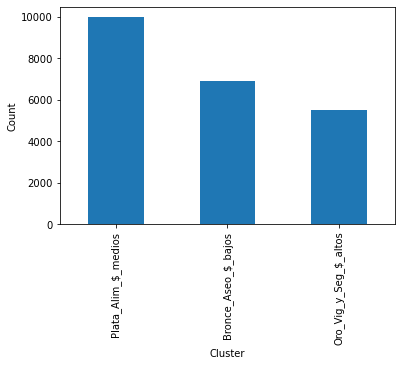

In [35]:
df_original['KMeans_Cluster'].value_counts().plot(kind='bar')
plt.ylabel('Count')
plt.xlabel('Cluster')

## GROUPBY CLUSTERS-ESTADO

In [36]:
df_orinigal_estado = df_original.groupby('KMeans_Cluster')['ESTADO'].value_counts()
df_orinigal_estado

KMeans_Cluster         ESTADO               
Bronce_Aseo_$_bajos    Orden en Proceso         3341
                       Recibido                 2585
                       Cancelado                 382
                       Finalizado Incompleto     305
                       Orden Rechazada           266
                       Pendiente por Aprobar      13
                       Recibido Parcial            6
                       Enviado                     5
Oro_Vig_y_Seg_$_altos  Recibido                 5457
                       Orden en Proceso           34
                       Cancelado                   4
                       Orden Rechazada             4
                       Finalizado Incompleto       3
                       Orden Confirmada            2
Plata_Alim_$_medios    Recibido                 6150
                       Orden en Proceso         1497
                       Cancelado                 753
                       Orden Rechazada           742
 

In [37]:
plt.style.use('default')

<AxesSubplot:xlabel='KMeans_Cluster'>

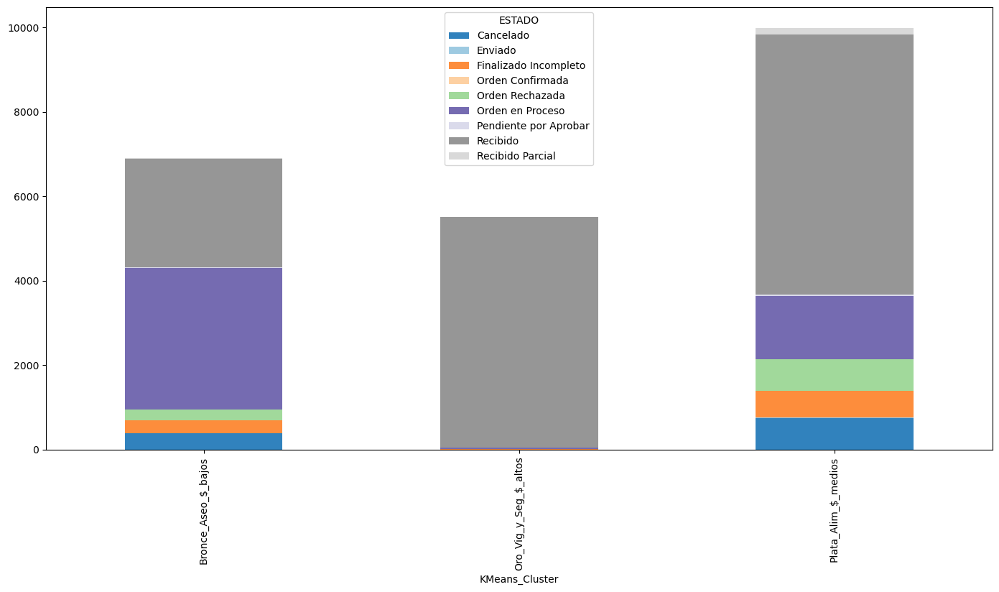

In [38]:
df_orinigal_estado.unstack().plot(kind='bar', stacked=True, figsize=(17,8),cmap=plt.get_cmap('tab20c'))

In [39]:
df_orinigal_estado1 = df_original.groupby('ESTADO')['KMeans_Cluster'].value_counts()
df_orinigal_estado1

ESTADO                 KMeans_Cluster       
Cancelado              Plata_Alim_$_medios       753
                       Bronce_Aseo_$_bajos       382
                       Oro_Vig_y_Seg_$_altos       4
Enviado                Plata_Alim_$_medios         7
                       Bronce_Aseo_$_bajos         5
Finalizado Incompleto  Plata_Alim_$_medios       628
                       Bronce_Aseo_$_bajos       305
                       Oro_Vig_y_Seg_$_altos       3
Orden Confirmada       Plata_Alim_$_medios        13
                       Oro_Vig_y_Seg_$_altos       2
Orden Rechazada        Plata_Alim_$_medios       742
                       Bronce_Aseo_$_bajos       266
                       Oro_Vig_y_Seg_$_altos       4
Orden en Proceso       Bronce_Aseo_$_bajos      3341
                       Plata_Alim_$_medios      1497
                       Oro_Vig_y_Seg_$_altos      34
Pendiente por Aprobar  Plata_Alim_$_medios        38
                       Bronce_Aseo_$_bajos        13
R

<AxesSubplot:xlabel='ESTADO'>

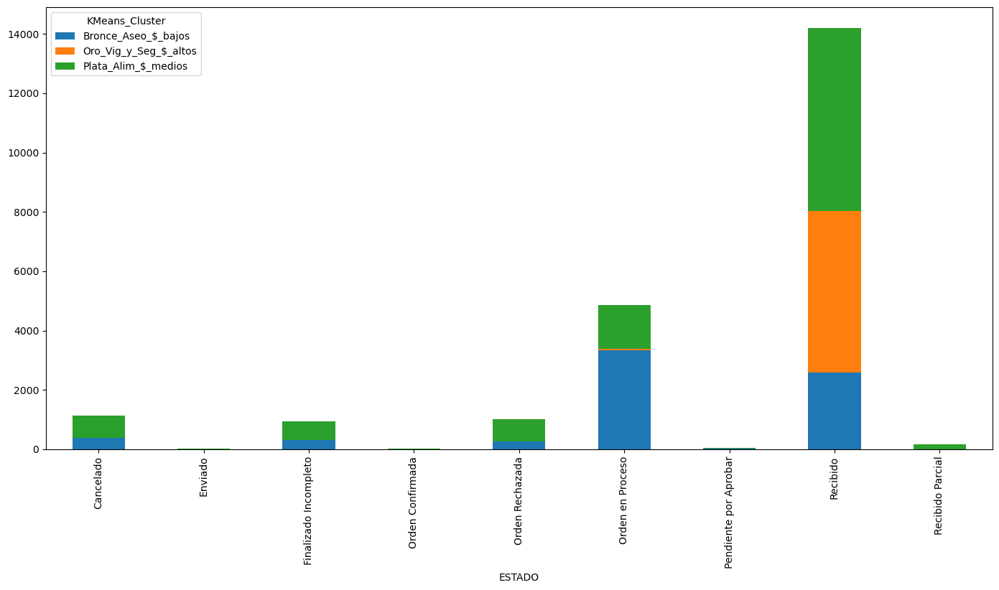

In [40]:
df_orinigal_estado1.unstack().plot(kind='bar', stacked=True, figsize=(17,8))

## GROUPBY CLUSTERS-TOTAL+IVA

In [42]:
df_original.groupby('KMeans_Cluster').agg({'TOTAL_SIN_IVA':['mean', 'sum']})

TOTAL_SIN_IVA            
                                mean         sum
KMeans_Cluster                                  
Bronce_Aseo_$_bajos    277918.949008  1918474505
Oro_Vig_y_Seg_$_altos  781738.741097  4302690031
Plata_Alim_$_medios    447905.373160  4472335151

<AxesSubplot:xlabel='KMeans_Cluster'>

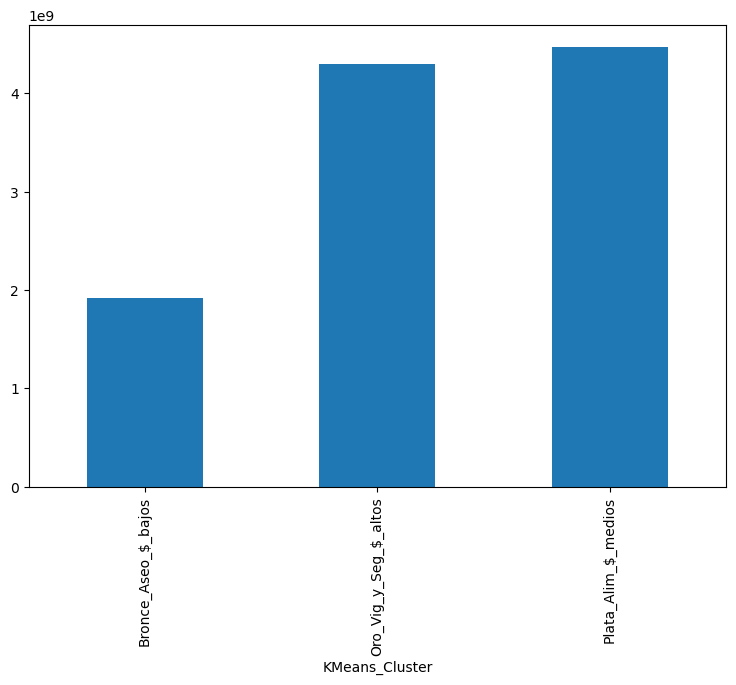

In [44]:
df_original.groupby('KMeans_Cluster')['TOTAL_SIN_IVA'].sum().plot(kind='bar', stacked=True, figsize=(9,6))

## GROUPBY CLUSTER-QUANTITY "PROVEEDORES"

<AxesSubplot:xlabel='KMeans_Cluster'>

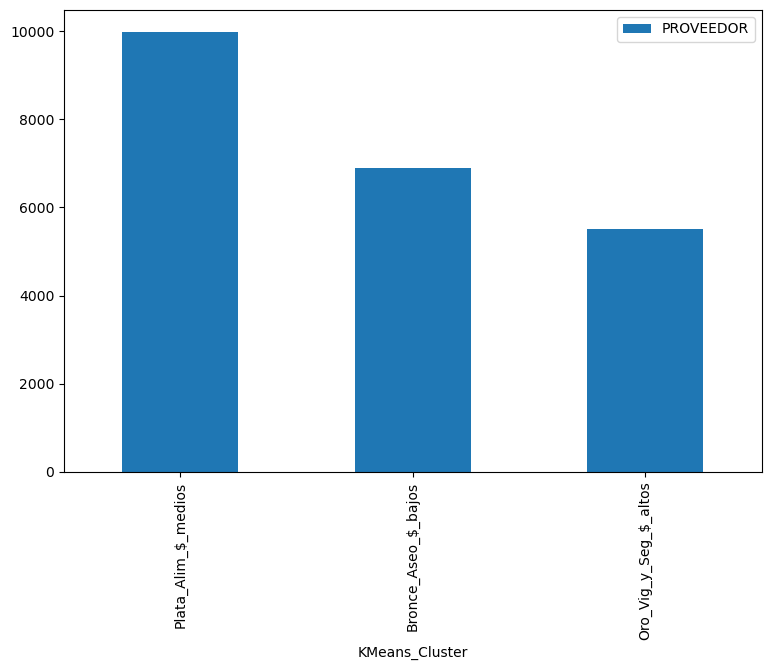

In [45]:
df_original.groupby('KMeans_Cluster').agg({'PROVEEDOR':'count'}).sort_values(by='PROVEEDOR',ascending=False).plot(kind='bar', stacked=True, figsize=(9,6))

In [46]:
df_original.columns

Index(['FECHA_ORDEN', 'CATEGORÍA', 'SUBCATEGORÍA', 'PROVEEDOR',
       'COMPAÑÍA_COMPRADORA', 'ESTADO', 'PRODUCTO_O_SERVICIO',
       'CANTIDAD_PEDIDA', 'CANTIDAD_RECIBIDA', 'PRECIO_UNITARIO', 'IVA',
       'TOTAL_SIN_IVA', 'KMeans_Cluster'],
      dtype='object')

## GROUPBY CLUSTER-COMPANHIA COMPRADORA

<AxesSubplot:xlabel='KMeans_Cluster'>

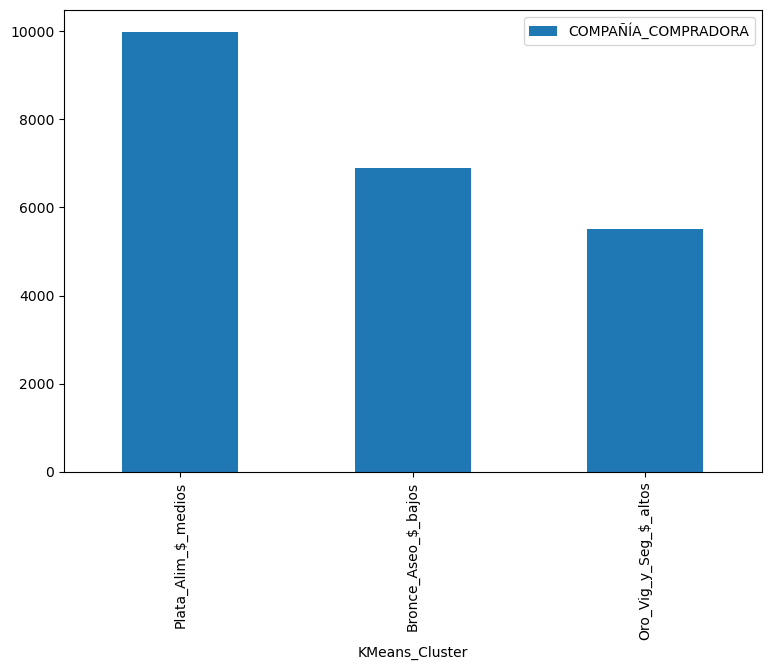

In [47]:
df_original.groupby('KMeans_Cluster').agg({'COMPAÑÍA_COMPRADORA':'count'}).sort_values(by='COMPAÑÍA_COMPRADORA',ascending=False).plot(kind='bar', stacked=True, figsize=(9,6))

In [48]:
df_original.groupby('KMeans_Cluster')['COMPAÑÍA_COMPRADORA'].value_counts().unstack()

COMPAÑÍA_COMPRADORA,Otros,Portal comprador 1,Portal comprador 2,Portal comprador 24,Portal comprador 29,Portal comprador 30,Portal comprador 4,Portal comprador 5,Portal comprador 6,Portal comprador 8
KMeans_Cluster,,,,,,,,,,
Bronce_Aseo_$_bajos,22.0,103.0,3115.0,NaN,3283.0,NaN,21.0,284.0,NaN,75.0
Oro_Vig_y_Seg_$_altos,5.0,NaN,10.0,5439.0,NaN,32.0,11.0,NaN,NaN,7.0
Plata_Alim_$_medios,595.0,6460.0,738.0,NaN,37.0,728.0,329.0,12.0,850.0,236.0


<AxesSubplot:xlabel='KMeans_Cluster'>

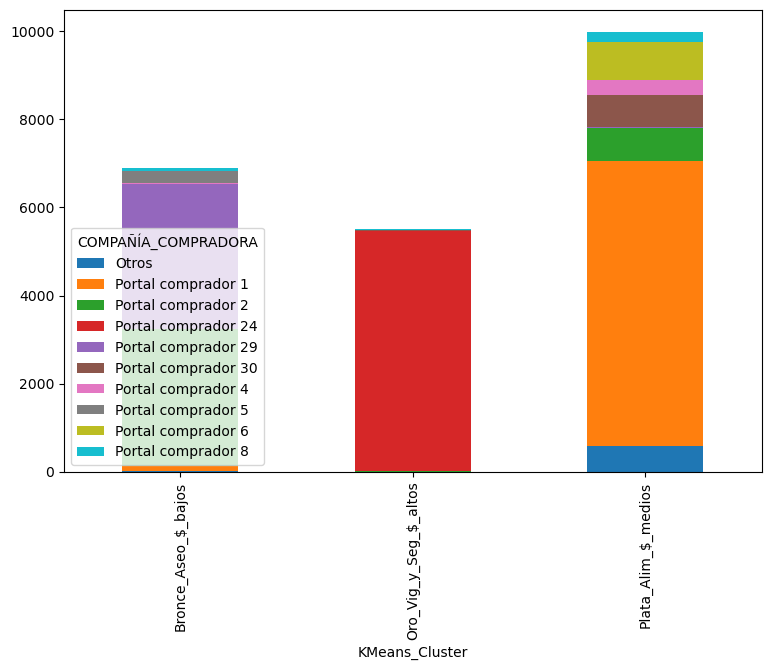

In [49]:
df_original.groupby('KMeans_Cluster')['COMPAÑÍA_COMPRADORA'].value_counts().unstack().plot(kind='bar', stacked=True, figsize=(9,6))

## GROUPBY CLUSTER-COMPANHIA PROVEEDOR

<AxesSubplot:xlabel='KMeans_Cluster'>

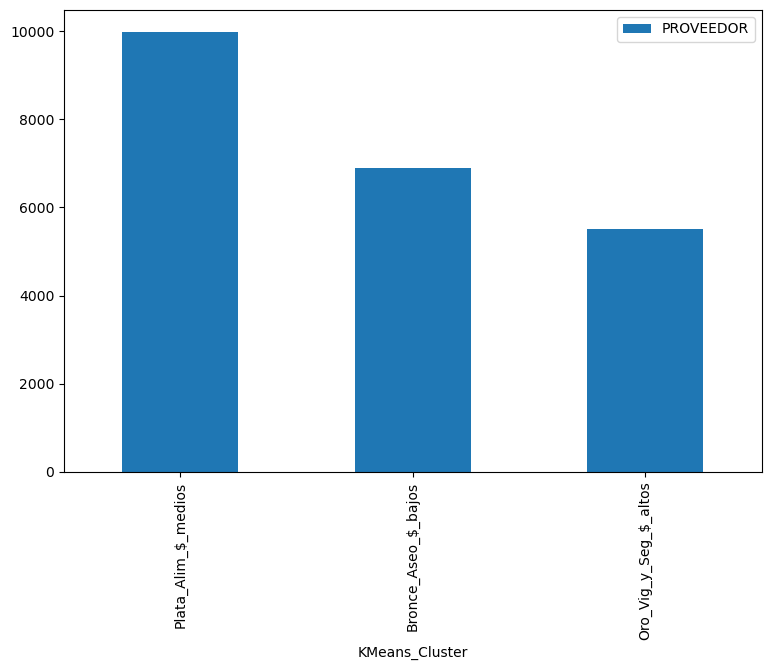

In [50]:
df_original.groupby('KMeans_Cluster').agg({'PROVEEDOR':'count'}).sort_values(by='PROVEEDOR',ascending=False).plot(kind='bar', stacked=True, figsize=(9,6))

<AxesSubplot:xlabel='KMeans_Cluster'>

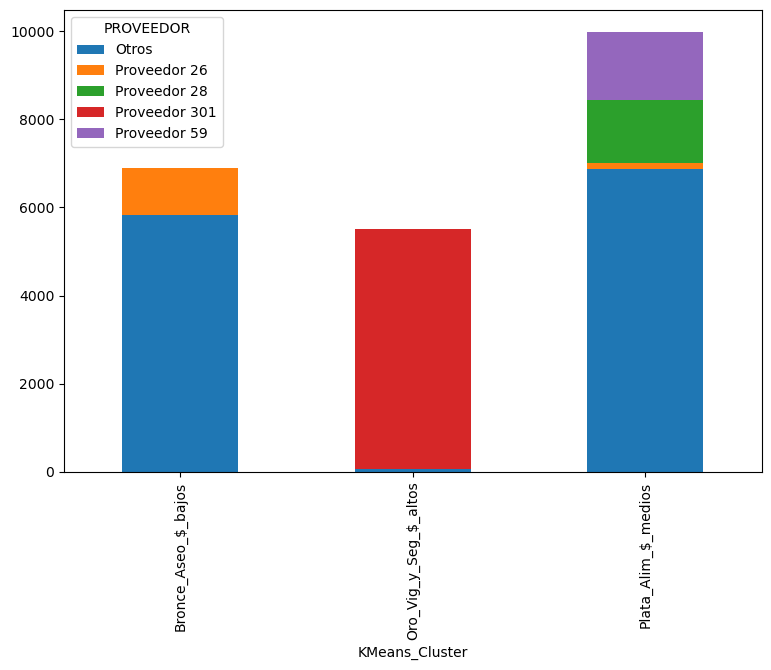

In [51]:
df_original.groupby('KMeans_Cluster')['PROVEEDOR'].value_counts().unstack().plot(kind='bar', stacked=True, figsize=(9,6))

<AxesSubplot:xlabel='KMeans_Cluster'>

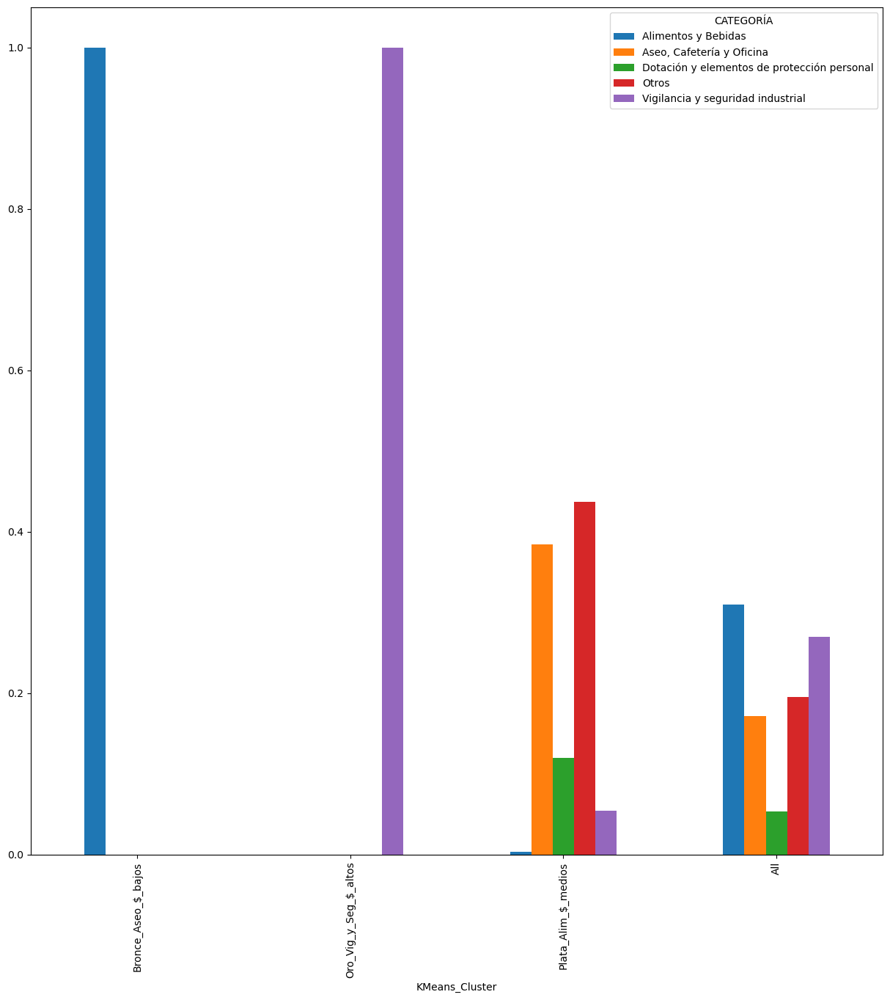

In [52]:
pd.crosstab(df_original['KMeans_Cluster'], df_original['CATEGORÍA'], margins=True, normalize='index').plot(kind='bar', figsize=(15,15), )

<AxesSubplot:xlabel='KMeans_Cluster'>

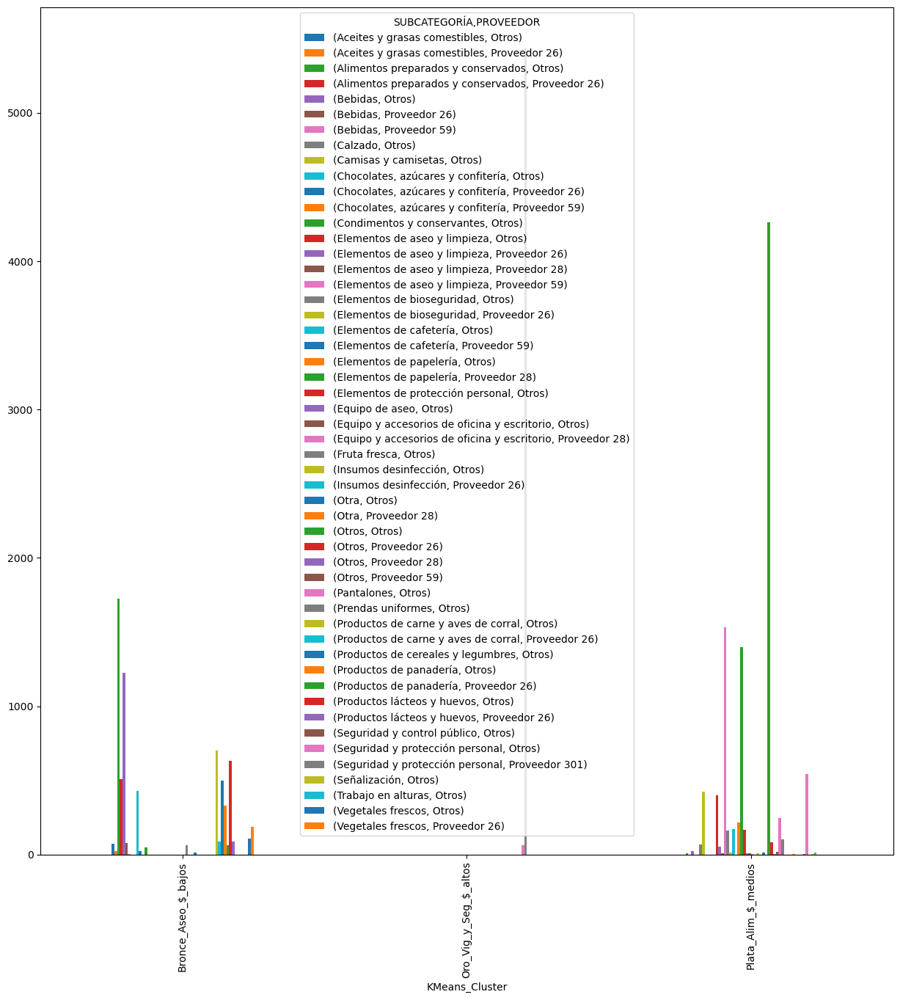

In [53]:
pd.crosstab(df_original['KMeans_Cluster'], [df_original['SUBCATEGORÍA'] , df_original['PROVEEDOR']]).plot(kind='bar', figsize=(15,15))

In [54]:
df_original_plus_clusters.to_excel('Proveindustriales_completo_y_clusters.xlsx', index=False)

In [55]:
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22392 entries, 0 to 22391
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   FECHA_ORDEN          22392 non-null  datetime64[ns]
 1   CATEGORÍA            22392 non-null  object        
 2   SUBCATEGORÍA         22392 non-null  object        
 3   PROVEEDOR            22392 non-null  object        
 4   COMPAÑÍA_COMPRADORA  22392 non-null  object        
 5   ESTADO               22392 non-null  object        
 6   PRODUCTO_O_SERVICIO  22392 non-null  object        
 7   CANTIDAD_PEDIDA      22392 non-null  float64       
 8   CANTIDAD_RECIBIDA    22392 non-null  float64       
 9   PRECIO_UNITARIO      22392 non-null  int64         
 10  IVA                  22392 non-null  int64         
 11  TOTAL_SIN_IVA        22392 non-null  int64         
 12  KMeans_Cluster       22392 non-null  object        
dtypes: datetime64[ns](1), float64(2

In [56]:
df_original.select_dtypes(['float', 'int', 'int64', 'float64', 'int32']).columns

Index(['CANTIDAD_PEDIDA', 'CANTIDAD_RECIBIDA', 'PRECIO_UNITARIO', 'IVA',
       'TOTAL_SIN_IVA'],
      dtype='object')

In [57]:
df1 = df_original

In [58]:
df1

,FECHA_ORDEN,CATEGORÍA,SUBCATEGORÍA,PROVEEDOR,COMPAÑÍA_COMPRADORA,ESTADO,PRODUCTO_O_SERVICIO,CANTIDAD_PEDIDA,CANTIDAD_RECIBIDA,PRECIO_UNITARIO,IVA,TOTAL_SIN_IVA,KMeans_Cluster
0,2021-11-10,Otros,Otros,Otros,Portal comprador 1,Orden en Proceso,Otros,2.0,0.0,23364,4439,46728,Plata_Alim_$_medios
1,2021-11-10,Otros,Otros,Otros,Portal comprador 1,Recibido,Otros,1.0,1.0,1476972,280625,1476972,Plata_Alim_$_medios
2,2021-11-10,Alimentos y Bebidas,Alimentos preparados y conservados,Otros,Portal comprador 1,Orden en Proceso,Lasagna,10.0,0.0,15500,0,155000,Bronce_Aseo_$_bajos
3,2021-11-10,Alimentos y Bebidas,Productos de carne y aves de corral,Otros,Portal comprador 2,Orden en Proceso,Pecho de Res Limpio/Sin Grasa,50.0,0.0,22000,0,1100000,Bronce_Aseo_$_bajos
4,2021-11-10,Otros,Otros,Otros,Otros,Recibido,Otros,7.0,7.0,92084,17496,644588,Plata_Alim_$_medios
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22387,2018-04-30,"Aseo, Cafetería y Oficina",Elementos de papelería,Otros,Portal comprador 8,Recibido,Grapadora,8.0,8.0,33613,6387,268908,Plata_Alim_$_medios
22388,2018-04-30,"Aseo, Cafetería y Oficina",Elementos de papelería,Otros,Portal comprador 8,Recibido,Lapicero Negro,1.0,1.0,588,112,588,Plata_Alim_$_medios
22389,2018-04-30,Otros,Otros,Otros,Portal comprador 8,Recibido,Otros,3.0,3.0,29412,5588,88235,Plata_Alim_$_medios
22390,2018-04-30,Otros,Otros,Otros,Portal comprador 8,Recibido,Otros,4.0,4.0,29412,5588,117647,Plata_Alim_$_medios


In [59]:

px.parallel_coordinates(df1, labels={"KMeans_Cluster": "clusters",
                   "CANTIDAD_PEDIDA": "CANTIDAD_PEDIDA", "CANTIDAD_RECIBIDA": "CANTIDAD_RECIBIDA",
                   "PRECIO_UNITARIO": "PRECIO_UNITARIO", "DURACIÓN_ENTREGA": "DURACIÓN_ENTREGA",
                    },
                    color_continuous_scale=px.colors.diverging.Tealrose, color_continuous_midpoint=2)
# fig.show()

In [61]:
df1 = df1[['COMPAÑÍA_COMPRADORA', 'PROVEEDOR',  'TOTAL_SIN_IVA', 'KMeans_Cluster' ]]

In [62]:
px.parallel_categories(df1)

In [64]:
px.scatter(df_original, x='CANTIDAD_PEDIDA', y='TOTAL_SIN_IVA', color='KMeans_Cluster')

## DESCRIPTION OF THE CLUSTERS

In [65]:
pd.options.display.max_columns = None
pd.options.display.float_format = '{:20,.2f}'.format

In [66]:
df.groupby('KMeans_Cluster').sum()

,CATEGORÍA_Alimentos y Bebidas,"CATEGORÍA_Aseo, Cafetería y Oficina",CATEGORÍA_Dotación y elementos de protección personal,CATEGORÍA_Otros,CATEGORÍA_Vigilancia y seguridad industrial,COMPAÑÍA_COMPRADORA_Otros,COMPAÑÍA_COMPRADORA_Portal comprador 1,COMPAÑÍA_COMPRADORA_Portal comprador 2,COMPAÑÍA_COMPRADORA_Portal comprador 24,COMPAÑÍA_COMPRADORA_Portal comprador 29,COMPAÑÍA_COMPRADORA_Portal comprador 30,COMPAÑÍA_COMPRADORA_Portal comprador 4,COMPAÑÍA_COMPRADORA_Portal comprador 5,COMPAÑÍA_COMPRADORA_Portal comprador 6,COMPAÑÍA_COMPRADORA_Portal comprador 8,CANTIDAD_PEDIDA,CANTIDAD_RECIBIDA,PRECIO_UNITARIO,IVA,TOTAL_SIN_IVA
KMeans_Cluster,,,,,,,,,,,,,,,,,,,,
0,35.00,"3,838.00","1,199.00","4,368.00",545.00,595.00,"6,460.00",738.00,0.00,37.00,728.00,329.00,12.00,850.00,236.00,45.30,14.76,"3,709.72",544.65,"8,709.96"
1,0.00,0.00,0.00,0.00,"5,504.00",5.00,0.00,10.00,"5,439.00",0.00,32.00,11.00,0.00,0.00,7.00,0.75,0.70,907.11,171.38,"5,307.63"
2,"6,903.00",0.00,0.00,0.00,0.00,22.00,103.00,"3,115.00",0.00,"3,283.00",0.00,21.00,284.00,0.00,75.00,20.68,0.56,"1,000.17",114.53,"6,616.63"


# METRICS

In [67]:
from sklearn import metrics

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.cluster import MeanShift
from sklearn.cluster import Birch
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import MiniBatchKMeans

# kprototipes

In [68]:
data = df.iloc[: , :-1]

In [69]:
data

,CATEGORÍA_Alimentos y Bebidas,"CATEGORÍA_Aseo, Cafetería y Oficina",CATEGORÍA_Dotación y elementos de protección personal,CATEGORÍA_Otros,CATEGORÍA_Vigilancia y seguridad industrial,COMPAÑÍA_COMPRADORA_Otros,COMPAÑÍA_COMPRADORA_Portal comprador 1,COMPAÑÍA_COMPRADORA_Portal comprador 2,COMPAÑÍA_COMPRADORA_Portal comprador 24,COMPAÑÍA_COMPRADORA_Portal comprador 29,COMPAÑÍA_COMPRADORA_Portal comprador 30,COMPAÑÍA_COMPRADORA_Portal comprador 4,COMPAÑÍA_COMPRADORA_Portal comprador 5,COMPAÑÍA_COMPRADORA_Portal comprador 6,COMPAÑÍA_COMPRADORA_Portal comprador 8,CANTIDAD_PEDIDA,CANTIDAD_RECIBIDA,PRECIO_UNITARIO,IVA,TOTAL_SIN_IVA
0,0.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.45,0.08,0.89
1,0.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.70,0.13,0.70
2,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.10,0.00,1.00
3,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.00,1.00
4,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.14,0.03,0.99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22387,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.12,0.02,0.99
22388,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.70,0.13,0.70
22389,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.32,0.06,0.95
22390,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.24,0.05,0.97


### SILHUOETTE

In [70]:
model_KMeans = clustering

In [71]:
metrics.silhouette_score(data, clustering.labels_)

0.49575930740462415

### AGGLOMERATIVE

In [72]:
model_AGGLOMERATIVE = AgglomerativeClustering(n_clusters = 3).fit(data)

In [73]:
metrics.silhouette_score(data, model_AGGLOMERATIVE.labels_)

0.4941179859546021

### BIRCH

In [74]:
model_BIRCH = Birch(n_clusters=3).fit(data)

In [75]:
metrics.silhouette_score(data, model_BIRCH.labels_)

0.3073365709017064

### MINIBATCHKMEANS

In [76]:
model_MINIBATCHKMEANS = MiniBatchKMeans(n_clusters=3, max_iter=300, batch_size=20).fit(data)

In [77]:
metrics.silhouette_score(data, model_MINIBATCHKMEANS.labels_)

0.4957573314725726

### PUT THE CLUSTER COLUMN TO GRAPH

In [78]:
df['KMeans_Cluster'] = model_KMeans.labels_

In [79]:
df.groupby('KMeans_Cluster').mean()

,CATEGORÍA_Alimentos y Bebidas,"CATEGORÍA_Aseo, Cafetería y Oficina",CATEGORÍA_Dotación y elementos de protección personal,CATEGORÍA_Otros,CATEGORÍA_Vigilancia y seguridad industrial,COMPAÑÍA_COMPRADORA_Otros,COMPAÑÍA_COMPRADORA_Portal comprador 1,COMPAÑÍA_COMPRADORA_Portal comprador 2,COMPAÑÍA_COMPRADORA_Portal comprador 24,COMPAÑÍA_COMPRADORA_Portal comprador 29,COMPAÑÍA_COMPRADORA_Portal comprador 30,COMPAÑÍA_COMPRADORA_Portal comprador 4,COMPAÑÍA_COMPRADORA_Portal comprador 5,COMPAÑÍA_COMPRADORA_Portal comprador 6,COMPAÑÍA_COMPRADORA_Portal comprador 8,CANTIDAD_PEDIDA,CANTIDAD_RECIBIDA,PRECIO_UNITARIO,IVA,TOTAL_SIN_IVA
KMeans_Cluster,,,,,,,,,,,,,,,,,,,,
0,0.00,0.38,0.12,0.44,0.05,0.06,0.65,0.07,0.00,0.00,0.07,0.03,0.00,0.09,0.02,0.00,0.00,0.37,0.05,0.87
1,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.99,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.03,0.96
2,1.00,0.00,0.00,0.00,0.00,0.00,0.01,0.45,0.00,0.48,0.00,0.00,0.04,0.00,0.01,0.00,0.00,0.14,0.02,0.96


## PCA TO TAKE A LOOK OF THE CLUSTER

In [0]:
from sklearn.decomposition import  PCA

In [0]:
pca = PCA(n_components=2)
pca_fit = pca.fit_transform(df)
pca_df = pd.DataFrame(data=pca_fit, columns=['Component_1', 'Component_2'])
pca_nombres = pd.concat([pca_df, df[['KMeans_Cluster']]], axis=1)

pca_nombres

,Component_1,Component_2,KMeans_Cluster
0,-0.46,-1.26,2
1,-0.88,-1.03,2
2,1.30,-0.38,0
3,1.68,-0.04,0
4,0.77,-0.02,0
...,...,...,...
22387,-0.62,-0.75,2
22388,-0.67,-0.82,2
22389,0.77,-0.02,0
22390,0.77,-0.01,0


Out[68]: <matplotlib.axes._subplots.AxesSubplot at 0x155636eb8c8>

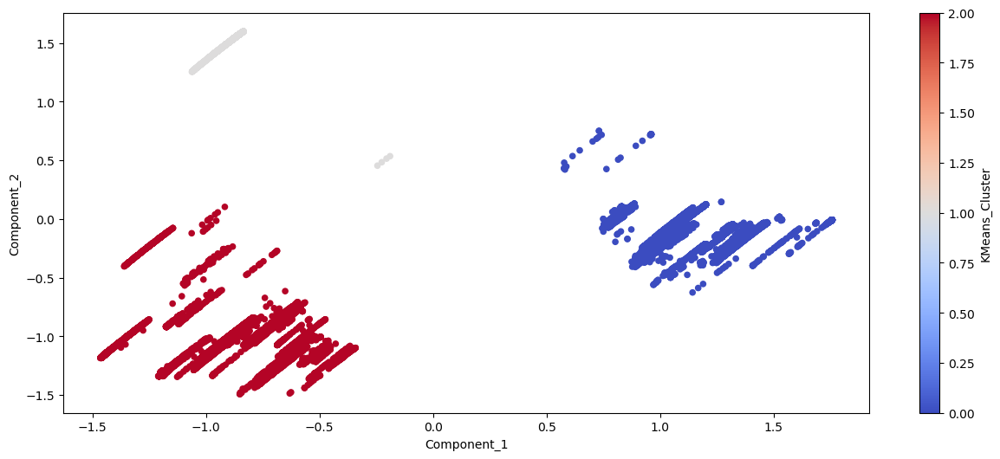

In [0]:
pca_nombres.plot.scatter(x='Component_1', y='Component_2', c='KMeans_Cluster',cmap='coolwarm', figsize=(15, 6))

In [0]:
px.scatter(pca_nombres, x="Component_1", y="Component_2", color="KMeans_Cluster", color_continuous_scale=px.colors.sequential.Viridis)